In [7]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt


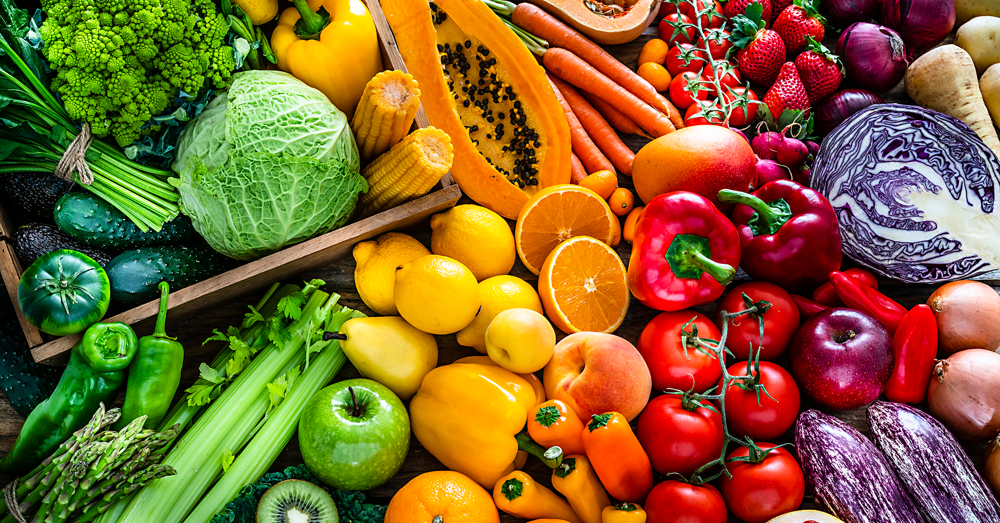

In [15]:
originalImages = Image.open('uas/Image1.jpg')
rgbImages = originalImages.convert('RGB')

rgbImages

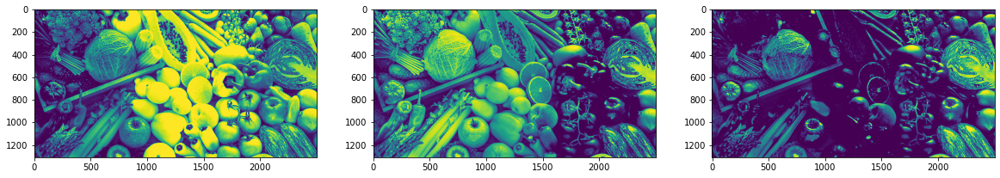

In [71]:
R,G,B = rgbImages.split()

plt.figure(figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(R)
plt.subplot(1,3,2)
plt.imshow(G)
plt.subplot(1,3,3)
plt.imshow(B)
plt.show()

In [16]:
# convert to hsv
hsvImages = rgbImages.convert('HSV')
hue, saturation, value = hsvImages.split()


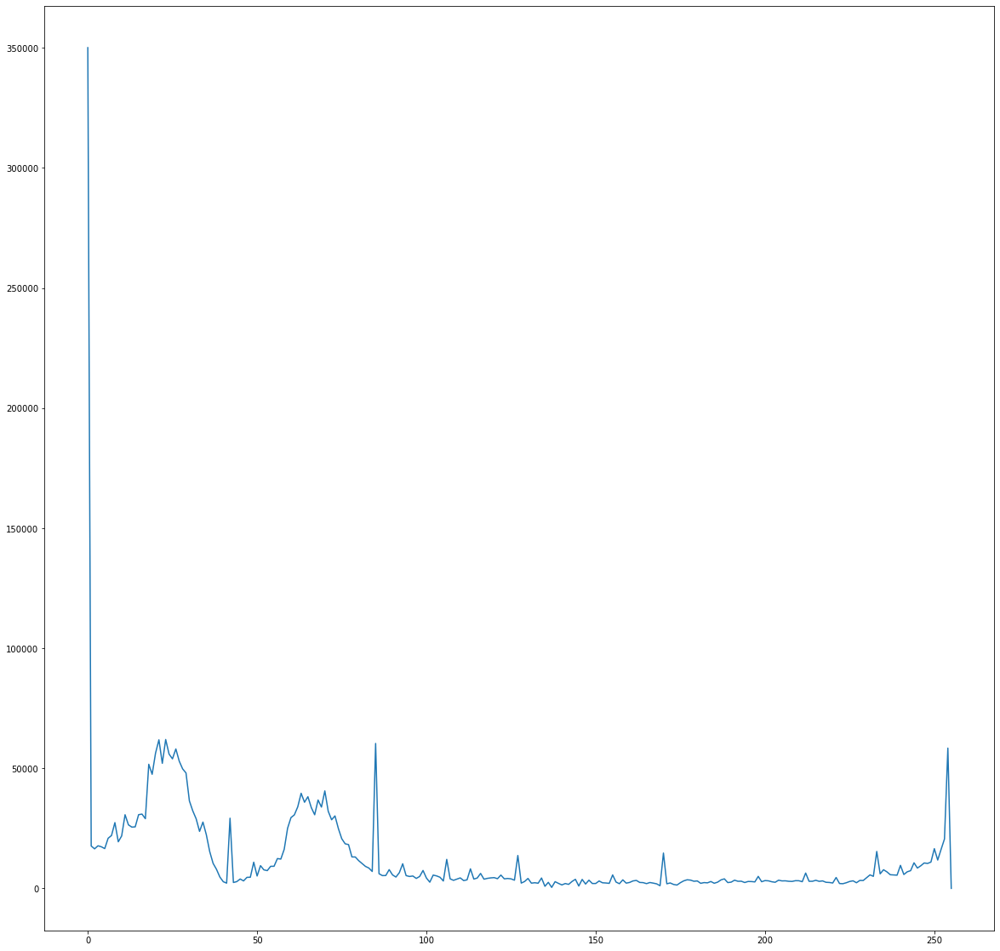

In [77]:
# plot line chart of hue detail of x axis
plt.figure(figsize=(20,20))
plt.plot(hue.histogram())
# default_x_ticks = range(len(hue.histogram()))
# plt.xticks(default_x_ticks)
plt.show()




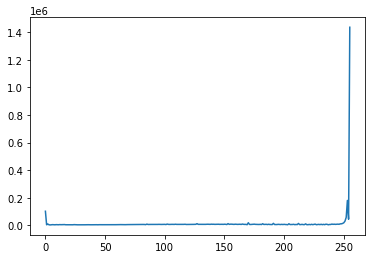

In [18]:
plt.plot(saturation.histogram())
plt.show()

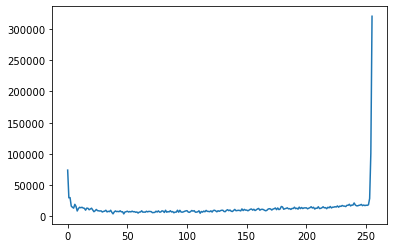

In [19]:
plt.plot(value.histogram())
plt.show()

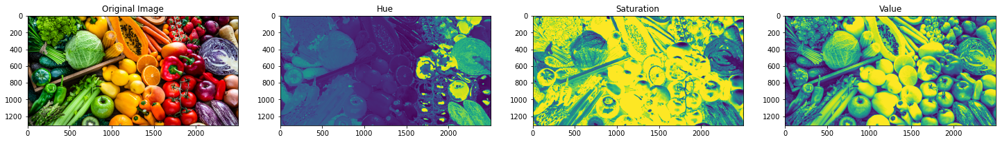

In [20]:
# plot original image, hue, saturation, value
fig, axs = plt.subplots(1, 4, figsize=(25, 25))
axs[0].imshow(originalImages)
axs[0].set_title('Original Image')
axs[1].imshow(hue)
axs[1].set_title('Hue')
axs[2].imshow(saturation)
axs[2].set_title('Saturation')
axs[3].imshow(value)
axs[3].set_title('Value')
plt.show()



In [ ]:
# most often range of hue
most_often = [(0, 45), (45,90), (90, 135), (180, 225), (225, 270)]

# for each color in most_often range and make binary image
binaryImages = []
for color in most_often:
    binaryImage = np.zeros((value.size[1], value.size[0]))
    for i in range(value.size[0]):
        for j in range(value.size[1]):
            if hue.getpixel((i, j)) > color[0] and hue.getpixel((i, j)) < color[1]:
                binaryImage[j, i] = 1
    binaryImages.append(binaryImage)




In [25]:
print(binaryImages[0])

[[0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


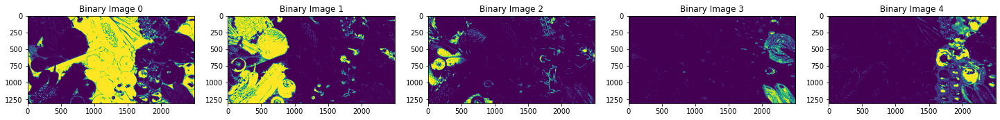

In [24]:
# plot binary image
fig, axs = plt.subplots(1,5, figsize=(25, 25))
for i in range(len(binaryImages)):
    axs[i].imshow(binaryImages[i])
    axs[i].set_title('Binary Image ' + str(i))
plt.show()

In [27]:
# doing operation for edge detection of saturation image
from edgeDetector import *
from sharpening import *



In [32]:
# make function for gaussian filter for hsv image
def gaussianFilterHSV(img_input, coldepth):
    if coldepth!=24:
        img_input = img_input.convert('RGB')
    
    pixels = img_input.load()
    horizontalSize = img_input.size[0]
    verticalSize = img_input.size[1]
    img_output = Image.new("RGB", (horizontalSize, verticalSize))
    newPixels = img_output.load()

    mask = [[1,2,1],
            [2,4,2],
            [1,2,1]]
    for i in range(1,horizontalSize-1):
        for j in range(1,verticalSize-1):
            r = 0
            g = 0
            b = 0
            for k in range(3):
                for l in range(3):
                    r += pixels[i+k-1,j+l-1][0]*mask[k][l]
                    g += pixels[i+k-1,j+l-1][1]*mask[k][l]
                    b += pixels[i+k-1,j+l-1][2]*mask[k][l]
            newPixels[i,j] = (r//16,g//16,b//16)

    if coldepth==1:
        img_output = img_output.convert("1")
    elif coldepth==8:
        img_output = img_output.convert("L")
    else:
        img_output = img_output.convert("RGB")

    return img_output


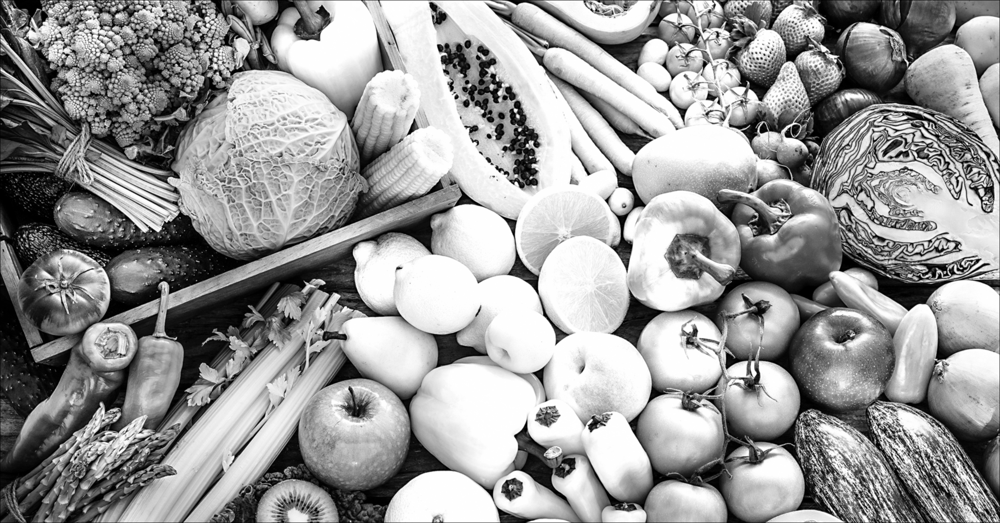

In [35]:
applyGaussianFilterHSV = gaussianFilterHSV(value, 8)
applyGaussianFilterHSV

In [37]:
# apply edge detection 
applyEdgeDetection = LaplacianFilter(applyGaussianFilterHSV, 8, 3)

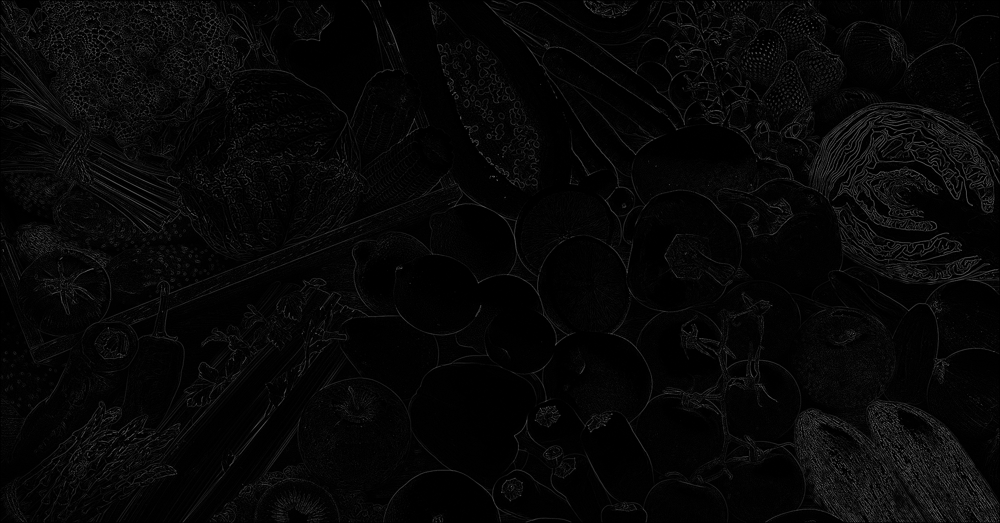

In [38]:
applyEdgeDetection

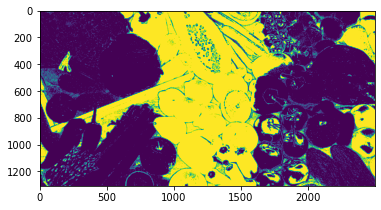

In [42]:
# use dila


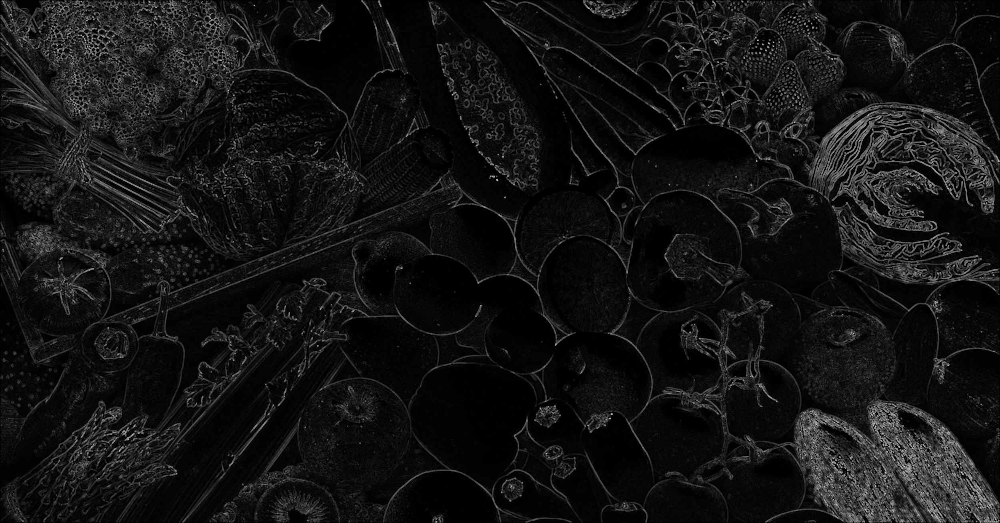

In [51]:
from morphological import *

# apply dilation
applyDilation = Dilation(applyEdgeDetection, 2)
applyDilation

In [57]:
# fungsi untuk menambahkan hasil edge detection ke dalam gambar binary
def addEdgeDetection(binaryImage, edgeDetectionImage):
    for i in range(edgeDetectionImage.size[0]):
        for j in range(edgeDetectionImage.size[1]):
            if edgeDetectionImage.getpixel((i, j)) > 0:
                binaryImage[j, i] = 1
    return binaryImage

# add edge detection to binary image
for i in range(len(binaryImages)):
    binaryImages[i] = addEdgeDetection(binaryImages[i], applyEdgeDetection)



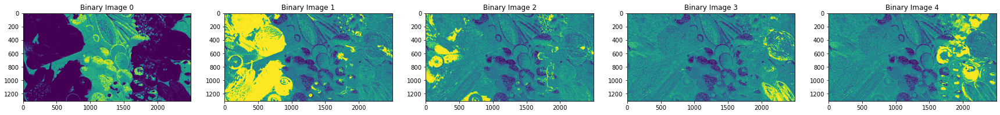

In [59]:
# plot binary image
fig, axs = plt.subplots(1,5, figsize=(30, 30))
for i in range(len(binaryImages)):
    axs[i].imshow(binaryImages[i])
    axs[i].set_title('Binary Image ' + str(i))

In [62]:
#  Opening dengan structuring element SE berbentuk disk/lingkaran.
import scipy.ndimage as ndimage

def disk_structuring_element(radius):
    se = np.zeros((2*radius+1, 2*radius+1))
    for i in range(2*radius+1):
        for j in range(2*radius+1):
            if (i-radius)**2 + (j-radius)**2 <= radius**2:
                se[i,j] = 1
    return se

def opening(img, radius):
    se = disk_structuring_element(radius)
    img = ndimage.binary_opening(img, se)
    return img

# apply opening
for i in range(len(binaryImages)):
    binaryImages[i] = opening(binaryImages[i], 2)




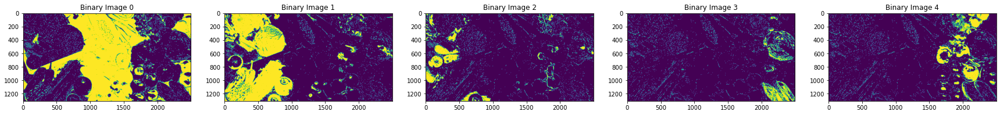

In [63]:
# plot binary image
fig, axs = plt.subplots(1,5, figsize=(30, 30))
for i in range(len(binaryImages)):
    axs[i].imshow(binaryImages[i])
    axs[i].set_title('Binary Image ' + str(i))

In [68]:
# make funtion for count object in binary image using opencv
import cv2
def countObject(binaryImage):
    opened = ndimage.binary_opening(binaryImage, structure= np.ones((3,3))).astype(np.int)

    th, tresh = cv2.threshold(opened.astype(np.uint8), 100, 255, cv2.THRESH_BINARY_INV|cv2.THRESH_OTSU)

    contours = cv2.findContours(tresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
    return len(contours)
    

# count object in binary image
for i in range(len(binaryImages)):
    print('Object in binary image ' + str(i) + ' : ' + str(countObject(binaryImages[i])))





C:\Users\sindu\AppData\Local\Temp/ipykernel_10192/4064182411.py:4: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  opened = ndimage.binary_opening(binaryImage, structure= np.ones((3,3))).astype(np.int)


Object in binary image 0 : 1705
Object in binary image 1 : 1390
Object in binary image 2 : 208
Object in binary image 3 : 391
Object in binary image 4 : 180


In [69]:
# make function for count object in binary image using scipy
def countObjectScipy(binaryImage):
    opened = ndimage.binary_opening(binaryImage, structure= np.ones((3,3))).astype(np.int)

    th, tresh = cv2.threshold(opened.astype(np.uint8), 100, 255, cv2.THRESH_BINARY_INV|cv2.THRESH_OTSU)

    contours = cv2.findContours(tresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]
    return len(contours)

# count object in binary image
for i in range(len(binaryImages)):
    print('Object in binary image ' + str(i) + ' : ' + str(countObjectScipy(binaryImages[i])))
    

C:\Users\sindu\AppData\Local\Temp/ipykernel_10192/1065153695.py:3: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  opened = ndimage.binary_opening(binaryImage, structure= np.ones((3,3))).astype(np.int)


Object in binary image 0 : 1705
Object in binary image 1 : 1390
Object in binary image 2 : 208
Object in binary image 3 : 391
Object in binary image 4 : 180
